# Cloud Botany shallow convection simulations
## calculations of mesoscale pattern entropy (information) 

### Working with a downloaded 256x256 subset, grabbed/saved by other notebook in this folder 

In [1]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np # https://github.com/numpy/numpy/issues/23775
import pandas as pd

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


# Open datasets.  
## ds_profiles is the master dataset where computed quantities are stashed

In [126]:
ds_profiles = xr.open_dataset('/Users/bmapes/Box/EvolutionaryConvection/CloudBotany/CloudBotany_profilesuv.nc')
ds_profiles      #.wthvt[10][10].plot() # typical value 0.01

<xarray.Dataset>
Dimensions:  (member: 103, time: 720, zm: 175, zt: 175)
Coordinates:
  * member   (member) int64 1 2 3 4 5 6 7 8 9 ... 95 96 97 98 99 100 101 102 103
  * time     (time) datetime64[ns] 2020-02-01T00:05:00 ... 2020-02-03T12:00:00
  * zm       (zm) float32 0.0 15.0 30.0 45.3 ... 6.772e+03 6.854e+03 6.938e+03
  * zt       (zt) float32 7.5 22.5 37.65 52.95 ... 6.813e+03 6.896e+03 6.98e+03
Data variables:
    wthvt    (member, time, zm) float32 ...
    ql       (member, time, zt) float32 ...
    ql2r     (member, time, zt) float32 ...
    cfrac    (member, time, zt) float32 ...
    w2r      (member, time, zm) float32 ...
    u        (member, time, zt) float32 ...
    v        (member, time, zt) float32 ...
Attributes:
    Author:   
    Source:   DALES 4.2 git: v4.3-108-gca69cb
    history:  Created on 20220520 at 213340.423
    title:    profiles.001.nc

In [3]:
# 2D dataset contains lwp and twp and surfprec 
# ds_2D = xr.open_dataset('/Users/bmapes/Box/EvolutionaryConvection/CloudBotany/CloudBotany_patterns256_twp_Navwifi.nc')
# ds_2D = xr.open_dataset('/Users/bmapes/Box/EvolutionaryConvection/CloudBotany/CloudBotany_patterns256_UMwifi.nc')

ds_2D = xr.open_dataset('/Users/bmapes/Box/EvolutionaryConvection/CloudBotany/CloudBotany_patterns256.nc')
ds_2D

<xarray.Dataset>
Dimensions:   (member: 103, time: 18, yt: 256, xt: 256)
Coordinates:
  * member    (member) int32 1 2 3 4 5 6 7 8 9 ... 96 97 98 99 100 101 102 103
  * time      (time) datetime64[ns] 2020-02-01T00:05:00 ... 2020-02-03T08:45:00
  * xt        (xt) float64 50.0 650.0 1.25e+03 ... 1.518e+05 1.524e+05 1.53e+05
  * yt        (yt) float64 50.0 650.0 1.25e+03 ... 1.518e+05 1.524e+05 1.53e+05
Data variables:
    lwp       (member, time, yt, xt) float32 ...
    surfprec  (member, time, yt, xt) float32 ...
Attributes:
    CDI:          Climate Data Interface version 2.0.4 (https://mpimet.mpg.de...
    CDO:          Climate Data Operators version 2.0.4 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Thu May 26 04:40:08 2022: cdo -f nc4 -z zip_6 -r -O collgri...
    title:        000/cape.x000y000.001.nc

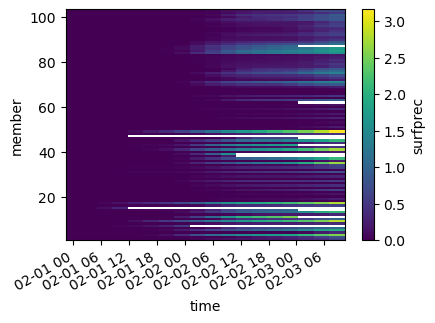

In [4]:
# Is there missing precip, nan values? yes, same in multiple save files, time 
ds_2D.surfprec.mean(dim=['xt','yt']).cumulative_integrate('time','s').plot(size=3,aspect=1.5)

# for example case 14 lost after time 3 
# ds_2D.surfprec[14][3].plot()

In [5]:
# dstwp = xr.open_dataset('/Users/bmapes//Box/EvolutionaryConvection/CloudBotany/
#         CloudBotany_patterns256_twp_Navwifi.nc')
# twp is the only field: member:103  time: 18  yt: 256   xt: 256

## Compute KE budget terms 
### Add energy throughput, Integrated Buoyancy Flux IBF, to ds_profiles

$ d/dt<[KE]> = <[w * dw/dt]> = <[wb]> $

$ = <  w' \cdot \theta_v' > g/ \theta_{v_0}  $

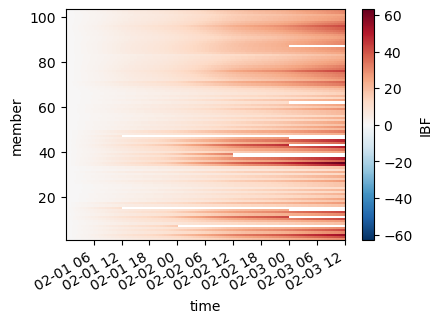

In [127]:
# Time integrate (cumulate) the vertical mean KE source from buoyancy flux
g_over_th0 = 9.81/290 # approximately constant theta-v for environment unit conversion

ds_profiles['IBF'] = ds_profiles.wthvt.mean('zm').cumulative_integrate('time','s') \
                        *g_over_th0
ds_profiles.IBF.plot( size=3,aspect=1.5 ) 

Text(0.5, 1.0, 'VKE')

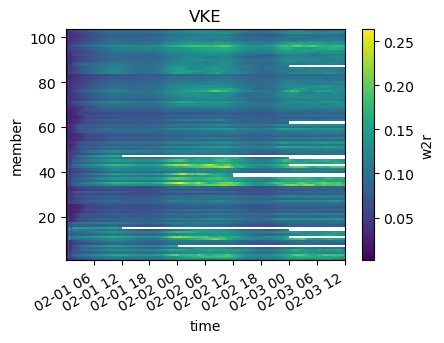

In [128]:
# Actual vertically integrated VKE (w2r): 
#    ratio to IBF implies ~1/4 hour bulk residence time...
# so there are ~100 turnovers/replacements per day in bulk VKE 

ds_profiles.w2r.mean('zm').plot( size=3, aspect=1.5); plt.title('VKE')

In [8]:
def information(PDF): 
    # just make sure it is a PDF (sums to one) 
    PDF = PDF/np.sum(PDF)

    # information subtracts a same-sized but uniform PDF, p=1/size(PDF) 
    nullPDF = 1./ np.size(PDF)

    # for log2, need to make sure the zeros are replaced with 1e-99
    Smax = -np.log2(nullPDF)
    H = Smax - (-np.sum( PDF * np.log2(PDF+1e-99)))
    
    return(H)

In [263]:
def norm_information(PDF): 
    # just make sure it is a PDF (sums to one) 
    PDF = PDF/np.sum(PDF)

    # information subtracts a same-sized but uniform PDF, p=1/size(PDF) 
    nullPDF = 1./ np.size(PDF)

    # for log2, need to make sure the zeros are replaced with 1e-99
    Smax = -np.log2(nullPDF)
    H = Smax - (-np.sum( PDF * np.log2(PDF+1e-99)))
    
    return(H/Smax)

In [264]:
# composite_around_nonzeros_periodic(array) function to make an instantaneous composite array around nonzero values in a 2D arrray

def composite_around_nonzeros_periodic(spotty):
    # Loop over locations, roll the array, and tally the sum of a categorical (0 or 1) array

    result = spotty.copy()*0.  # right sized container of zeros

# Locations to center the composite around 
    i_vals, j_vals = np.where(spotty) 
    NX,NY = spotty.shape
    halfNX = int(NX/2); halfNY = int(NY/2)

# Loop over nonzero ("active") locations, roll the array, and tally the sum 
    for active in range( len(i_vals) ):
        rolled = np.roll(spotty, (halfNX-i_vals[active], halfNY-j_vals[active]), axis=(0, 1))
        composite_sum += rolled
        composite_num += 1.0 
    
# Final result:
        composite = composite_sum / composite_num

    return(composite)

----------------
# Relating mesoscale pattern information H to age, IBF, IP 
### in 256x256 = 1/6 downsampling of original 1536x1536 x,y array size 

What do I mean by pattern information? Deviations from maximum entropy (uniformity) of a PDF. But what PDF? Here I want to measure *spatial* nonuniformity of cloudiness, at *coarse* scales, setting aside *total cloudiness* variations across all the snapshots. For this reason, my PDF should be **the probability of each pixel being in the upper decile of LWP**, which can then be coarse-grained (block-averaged) to various resolutions. Of course IF CLOUD COVER IS LESS THAN 10%, this will fail (the decile coverage will be bounded above by the cloud cover itself). Discard those scenes.  

#### Structure of results arrays for correlating: 
information H, Integrated Buoyancy Flux IBF, Integrated Precip IP, and temporal age. 

H(member,age,octave of rebinning 2,4,8,...) = Smax-S where S is entropy

IBF(member, age)

IP(member, age) = ds_2D.surfprec.sum(dims=['xt','yt'])

age(member, age) 

Q: Might the information at each coarse-grain scale add up to the total information, like variance in Parseval's theorem for orthogonal Fourier analysis? Need to study as math perhaps, will see in numbers here. Not crucial. 

In [ ]:
# Loop to compute pattern information H by scale octave 

octaves = 2**np.linspace(0,7,8) # REBIN 2x, 4x, ... floats 2.,4,8,...128.
uni_p = 1./(256. /octaves)**2   # uniform probability, 1 divided by NBINS
Smaxoc = -np.log2(uni_p)        # maximum entropy Smax of the above 

# Structure of results: 
NSIM = ds_2D.member.values.size   # number of simulations 
NT = 18                           # 200min = 3:20 time gap, "time=slice(None, None, 10)"
NOCT = octaves.size
# time axis 
tt = np.arange(NT)*200./60.  #hours

# Information entropy values H: container for results of loop 
Hs = np.zeros( (NSIM,NT,NOCT) )

# THE BIG LOOP over ensemble members (simulations)
for mem in range( ds_2D.member.size ):
    print('simulation ',mem)
    for it in range(2,18):   # times 200 minutes apart, not the first two 
        sq = ds_2D.lwp[mem][it]
        
# create 'active' and 'p_active' arrays: 1 for top 10% of LWP, all others 0
        decile9 = np.sort( np.ravel( sq.values) )[9*sq.size//10]   # 9/10 decile 
        active = (sq > decile9)
        p_active = active/np.sum(active) # probability, because it sums to 1
        
# LOOP over coarsening blocks, resampled back onto 256x256 grid 
        for isc,scale in enumerate(octaves): 
            blocksize = int(scale)
            cp_active = p_active.coarsen(xt=blocksize, yt=blocksize).mean().\
                interp_like(active, method='nearest', kwargs={"fill_value": "extrapolate"})

# Collect the result: information H in bits, from the coarsened p_active array 
            Hs[mem,it,isc] = information(cp_active)

            if( Hs[mem,it,isc] < 0 ): 
                print('negative, what th? ',mem,it,isc, Hs[mem,it,isc] ) 
                stop
                
## Set Hs for problematic cases: all white, all black (uniform), or if quintile is zero
            if( np.isnan(sq).any() ):  # if any missing data nan
                Hs[mem,it,isc] = 0 #float('NaN')   # no information is present but let nan propagate thru
            if( (sq == 0).sum() > 0.9*65536 ):      # if cloud fraction is < 10% 
                Hs[mem,it,isc] = 0 #float('NaN')   # declare it zero or NaN 

In [14]:
Hs.shape

(103, 18, 8)

-----------
# Mean over all members (simulations) of H 
## for different rebinning scales

Text(0.5, 1.0, 'All-exps mean evolution of H/Smax')

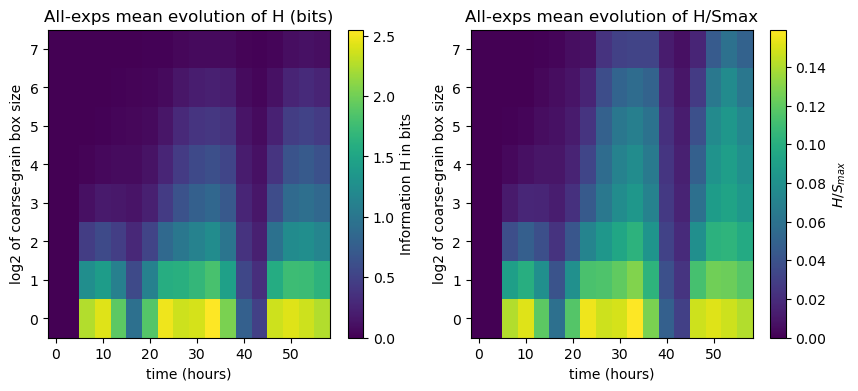

In [15]:
meanHspectrum = Hs.mean(0).transpose()
Smax_spectrum = meanHspectrum.copy()  # right sized container, will divide by Smax

# create fractional information, a fraction of Smax, for each octave of coarse-graining
# Smax is log2 of the uniform probability over a given sized domain (number of boxes).
uni_p = 1./(256. /octaves)**2
for it in range(np.size(tt)): 
    Smax_spectrum[:,it] = Smaxoc

plt.figure( figsize=(10,4) )
plt.subplot(121)
plt.pcolormesh(tt, np.log2(octaves), meanHspectrum,); 
cbar = plt.colorbar()
cbar.set_label('Information H in bits')
plt.ylabel('log2 of coarse-grain box size'); plt.xlabel('time (hours)'); 
plt.title('All-exps mean evolution of H (bits)')

plt.subplot(122)
plt.pcolormesh(tt, np.log2(octaves), meanHspectrum/Smax_spectrum,); 
cbar = plt.colorbar()
cbar.set_label('$H / S_{max}$')
plt.ylabel('log2 of coarse-grain box size'); plt.xlabel('time (hours)'); 
plt.title('All-exps mean evolution of H/Smax')

## Memberwise display of H and H/Smax at rebin octave oc=3
a scale that is consistent with anisotropy wavenumber limits 

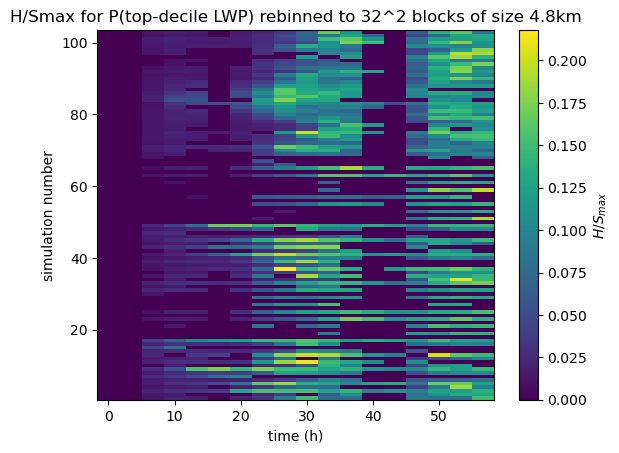

In [18]:
# Example time x sim grid for H

# Octave 3 (8x8 rebin of 256x256 undersampling of 1536x1536 original)
# (32x32 is the number of these, size is 4.8km) gives a good result 
# call it "mesoscale" (all wavenumbers lower than 32)

oc = 3 
boxsize = 0.6 *octaves[oc]   # km, boxsize as we have taken every 6th 100m gridcell

tt = np.arange(NT)*200./60.  #hours
sim= np.arange(NSIM) + 1   # number from 1 not from 0 
plt.pcolormesh(tt,sim, Hs[:,:,oc]/Smaxoc[oc]); 
cbar = plt.colorbar()
cbar.set_label('$H / S_{max}$')
plt.xlabel('time (h)');
plt.ylabel('simulation number');
plt.title('H/Smax for P(top-decile LWP) rebinned to '+str(int(256/octaves[oc]))+ \
          '^2 blocks of size '+str((boxsize))+'km');

-----------------
---------------------
# Properties underlying growth of mesoscale information H  
## Compute them and put them in ds_profiles, an area averaged dataset
### Anisotropy, Integrated precip, vertical-mean IBF (buoyancy flux), simple age (time)


### 1. Anisotropy is a bit complicated, uses fft in cylindrical coordinate
Nonuniformity of the variance of p_active (the probability a cell is in the upper decile of LWP) in the angular domain, for domain total wavenumbers of say 1-16, similar to the 32 boxes of oct=3 coarse-graining chosen for H plots below. 

In [34]:
# def calc_anisotropy(mem,it,doplot=True,doprint=True,min_wavenumber=2,max_wavenumber=16) 
# CODE FOR MANUALLY SELECTED CASE but also loop over cases 
# create 'active' and 'p_active' arrays: 1 for top 10% of LWP, all others 0
# input is member number and time in 200min increments

def calc_anisotropy(mem,it,doplot=True,doprint=True,min_wavenumber=2,max_wavenumber=16):   
    sq = ds_2D.lwp[mem][it]
    decile9 = np.sort( np.ravel( sq.values) )[9*sq.size//10]   # 9/10 decile 
    active = (sq > decile9)
    p_active = active/np.sum(active) # probability, because it sums to 1
    
    from scipy.fft import fft2, fftshift
    
    image_size = p_active.shape[0]
    
    # Apply Fourier Transform
    fft_result = fft2(p_active.values)
    
    # Shift zero frequency components to the center
    fft_result_shifted = fftshift(fft_result)
    
    # Calculate amplitude
    amplitude = np.abs(fft_result_shifted)
    
    # Create 2D wavenumber array
    kx = np.fft.fftshift(np.fft.fftfreq(image_size, d=1/image_size)) 
    ky = np.fft.fftshift(np.fft.fftfreq(image_size, d=1/image_size))
    kx, ky = np.meshgrid(kx, ky)
    
    # Calculate total wavenumber array
    wavenumbers = np.sqrt(kx**2 + ky**2)
    
    # Calculate the polar coordinates
    radius = np.sqrt(kx**2 + ky**2)
    theta = np.arctan2(ky, kx)
    
    # Average the amplitude where the TOTAL wavenumber is between 2 and 16
    in_k_range = (radius>min_wavenumber) & (radius<max_wavenumber)
    
    # Create theta bins
    num_bins = 36  # 10 degrees each bin 
    theta_bins = np.linspace(np.min(theta), np.max(theta), num_bins + 1)
    
    # Calculate the mean amplitude in each theta bin
    mean_amplitude = np.zeros(num_bins)
    for i in range(num_bins):
        in_bin = (theta >= theta_bins[i]) & (theta < theta_bins[i + 1])
        mean_amplitude[i] = np.mean(amplitude * in_k_range * in_bin)

    if(doplot): 
        # Plot the original image, amplitude, the annulus, and the fitted sinusoidal curve
        plt.figure(figsize=(16, 4))
        
        plt.subplot(141)
        plt.pcolormesh(p_active, cmap='viridis')
        plt.title('Original Image')
        
        plt.subplot(142)
        plt.pcolormesh(np.log1p(amplitude), cmap='viridis')
        plt.title('Log Amplitude Spectrum')
        
        plt.subplot(143)
        plt.pcolormesh(kx,ky, np.log1p(amplitude), cmap='viridis')
        ax = plt.gca()
        ax.set_xlim([-30, 30])
        ax.set_ylim([-30, 30])
        plt.contour(kx,ky,radius, levels=[min_wavenumber, max_wavenumber], colors='r', linewidths=2)
        plt.title('Wavenumber Annulus for anisotropy')
        
        plt.subplot(144)
        plt.plot(theta_bins[:-1] *180/3.1415 + 360/num_bins/2, mean_amplitude)
        plt.title('amplitude vs. angle in wavenumber annulus')
        
        plt.plot() 
        
        plt.tight_layout()
        plt.show()
        
    
    argmx = np.argmax(mean_amplitude)
    maxangle = theta_bins[ argmx ]
    maxangledeg = theta_bins[ argmx ] *180/3.1415 + 360/num_bins/2

# Compute information of angular distribtion of variance, normalized by Smax 
    Smax_angledist = -np.log2( 1.0/np.size(mean_amplitude) )
    anisotropyH = information(mean_amplitude) / Smax_angledist

    angvarpeak = np.max(mean_amplitude)/np.mean(mean_amplitude)

    if(doprint): 
        print('angle (degrees) is ', maxangledeg, maxangledeg+180)
        print('varpeak, ainsotropyH is ', angvarpeak, anisotropyH )

    return( angvarpeak )

In [37]:
# Loop to calculate A for all cases and times 

# Anisotropy strength A: make container for results of loop 
As = np.zeros( (NSIM,NT) )

# THE BIG LOOP over ensemble members (simulations)
for mem in range( ds_2D.member.size ):
    for it in range(ds_2D.time.size):   # times 200 minutes apart, not the first two 
        As[mem,it] = calc_anisotropy(mem,it,doplot=False,doprint=False)

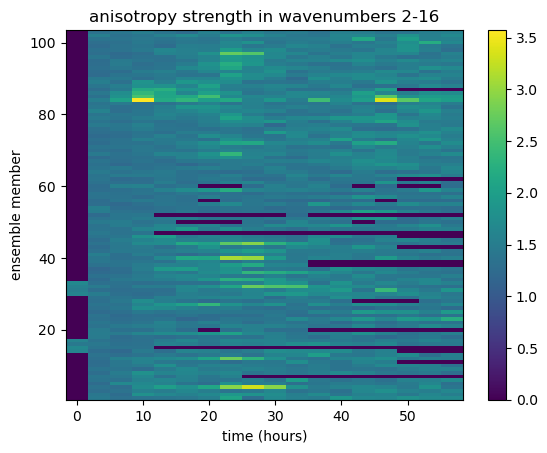

In [205]:
plt.pcolormesh(tt,sim, np.nan_to_num(As)); plt.colorbar(); # replace nAn with 0 
plt.xlabel('time (hours)'); 
plt.ylabel('ensemble member');
plt.title('anisotropy strength in wavenumbers 2-16'); 

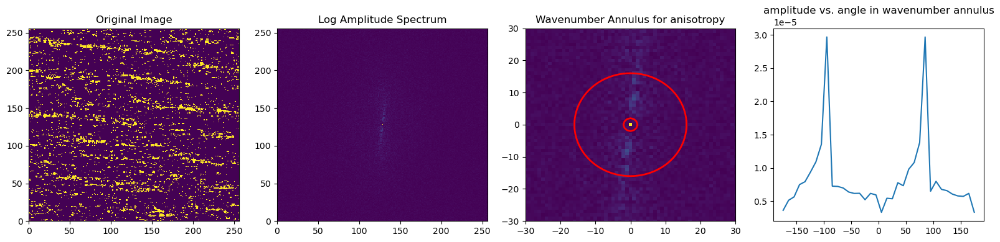

angle (degrees) is  -94.65479471926312 85.34520528073688
varpeak, ainsotropyH is  3.572145676312869 0.04588097991870306


3.572145676312869

In [224]:
# Maximum value case 
calc_anisotropy(83,3)

#calc_anisotropy(96,14)

## Simpler predictors or pathway coordinates: PR, IP, IBF, 'age'

In [129]:
# H5 (4.8km) and A and other predictors: insert back into ds_profiles dataset 
# ds_profiles['age'] = ds_profiles.time

ds_profiles['PR'] = ds_2D.surfprec.mean(dim=['xt','yt'])  # precip rate 
ds_profiles['IP'] = ds_2D.surfprec.mean(dim=['xt','yt']).cumulative_integrate('time','s') 

ds_profiles['BF'] = ds_profiles.wthvt.mean('zm') *g_over_th0
ds_profiles['IBF'] = ds_profiles.wthvt.mean('zm').cumulative_integrate('time','s') \
                        *g_over_th0

In [130]:
ds_pattern = ds_profiles.sel(time = ds_2D.time).drop_vars(['wthvt','ql','ql2r','cfrac','w2r','u','v'])
ds_pattern

<xarray.Dataset>
Dimensions:  (member: 103, time: 18, zm: 175, zt: 175)
Coordinates:
  * member   (member) int64 1 2 3 4 5 6 7 8 9 ... 95 96 97 98 99 100 101 102 103
  * time     (time) datetime64[ns] 2020-02-01T00:05:00 ... 2020-02-03T08:45:00
  * zm       (zm) float32 0.0 15.0 30.0 45.3 ... 6.772e+03 6.854e+03 6.938e+03
  * zt       (zt) float32 7.5 22.5 37.65 52.95 ... 6.813e+03 6.896e+03 6.98e+03
Data variables:
    IBF      (member, time) float64 0.0 0.9931 2.25 3.676 ... 24.56 26.63 28.45
    PR       (member, time) float32 0.0 0.0 1.031e-17 ... 4.532e-06 2.305e-06
    IP       (member, time) float64 0.0 0.0 6.187e-14 ... 0.4443 0.6312 0.6723
    BF       (member, time) float32 -5.263e-06 9.469e-05 ... 0.0001471 0.0001427
Attributes:
    Author:   
    Source:   DALES 4.2 git: v4.3-108-gca69cb
    history:  Created on 20220520 at 213340.423
    title:    profiles.001.nc

In [206]:
# Put H, Hnorm = H/Smax into data sate 
Hnorms = (Hs/Smaxoc) # Normalized H, array broadcasting works yay
Hn5 = Hnorms[:,:,3] # Octave 3, the 32x32 4.8km scale boxes 
dHn5 = Hn5 * 0.0  # container for 200-minute forward time differences, zero the default
dHn5[:,0:16] = Hn5[:,1:17] - Hn5[:,0:16]

var_dictA = {'Anis': (('member', 'time'), np.nan_to_num(As))}
var_dictH = {'H5': (('member', 'time'), Hs[:,:,oc])}
var_dictHn = {'Hn5': (('member', 'time'), Hn5)}
var_dictdHn = {'dHn5': (('member', 'time'), dHn5)}

ds_pattern = ds_pattern.assign(**var_dictA)
ds_pattern = ds_pattern.assign(**var_dictH)
ds_pattern = ds_pattern.assign(**var_dictHn)
ds_pattern = ds_pattern.assign(**var_dictdHn)

ds_pattern

<xarray.Dataset>
Dimensions:  (member: 103, time: 18, zm: 175, zt: 175)
Coordinates:
  * member   (member) int64 1 2 3 4 5 6 7 8 9 ... 95 96 97 98 99 100 101 102 103
  * time     (time) datetime64[ns] 2020-02-01T00:05:00 ... 2020-02-03T08:45:00
  * zm       (zm) float32 0.0 15.0 30.0 45.3 ... 6.772e+03 6.854e+03 6.938e+03
  * zt       (zt) float32 7.5 22.5 37.65 52.95 ... 6.813e+03 6.896e+03 6.98e+03
Data variables:
    IBF      (member, time) float64 0.0 0.9931 2.25 3.676 ... 24.56 26.63 28.45
    PR       (member, time) float32 0.0 0.0 1.031e-17 ... 4.532e-06 2.305e-06
    IP       (member, time) float64 0.0 0.0 6.187e-14 ... 0.4443 0.6312 0.6723
    BF       (member, time) float32 -5.263e-06 9.469e-05 ... 0.0001471 0.0001427
    Anis     (member, time) float64 0.0 1.442 1.323 1.369 ... 1.392 1.514 1.558
    H5       (member, time) float64 0.0 0.0 0.1258 0.2019 ... 1.366 1.599 0.8396
    Hn5      (member, time) float64 0.0 0.0 0.01258 ... 0.1366 0.1599 0.08396
    dHn5     (member, time) float64 0.0 0.01258 0.00761 ... 0.02322 0.0 0.0
Attributes:
    Author:   
    Source:   DALES 4.2 git: v4.3-108-gca69cb
    history:  Created on 20220520 at 213340.423
    title:    profiles.001.nc

In [207]:
ds_pattern.to_netcdf('CloudBotany_patterns_predictors.nc')
#'/~/GitHub/EvolutionaryConvection/Shallow_patterns_CloudBotany/CloudBotany_patterns_predictors.nc'

-----------------
# Analysis for the paper: a dataframe
### OK, now we have H and H/Smax for all simulations and times. We also have PR, IP, IBF, tt(age), and A = anisotropy. Can we visualize the growth pathways for H? First let's make a clean dataset, then plot within that frame. 

#### 1. Simple time and IBF and IP series 

In [133]:
list(ds_pattern.keys())

['IBF', 'PR', 'IP', 'BF', 'Anis', 'H5', 'Hn5', 'dHn5']

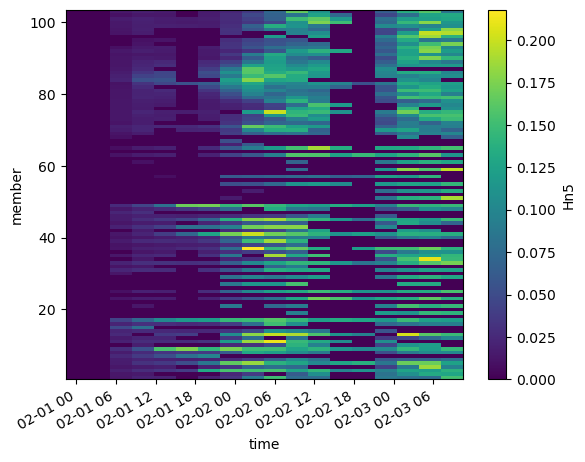

In [75]:
ds_pattern.Hn5.plot()

In [217]:
ds_pattern.member[0:2]

<xarray.DataArray 'member' (member: 2)>
array([1, 2])
Coordinates:
  * member   (member) int64 1 2

/var/folders/8f/r03vpksx46l5r53nhvpfywtc0000gn/T/ipykernel_25873/695055745.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure( figsize=(12,16) )


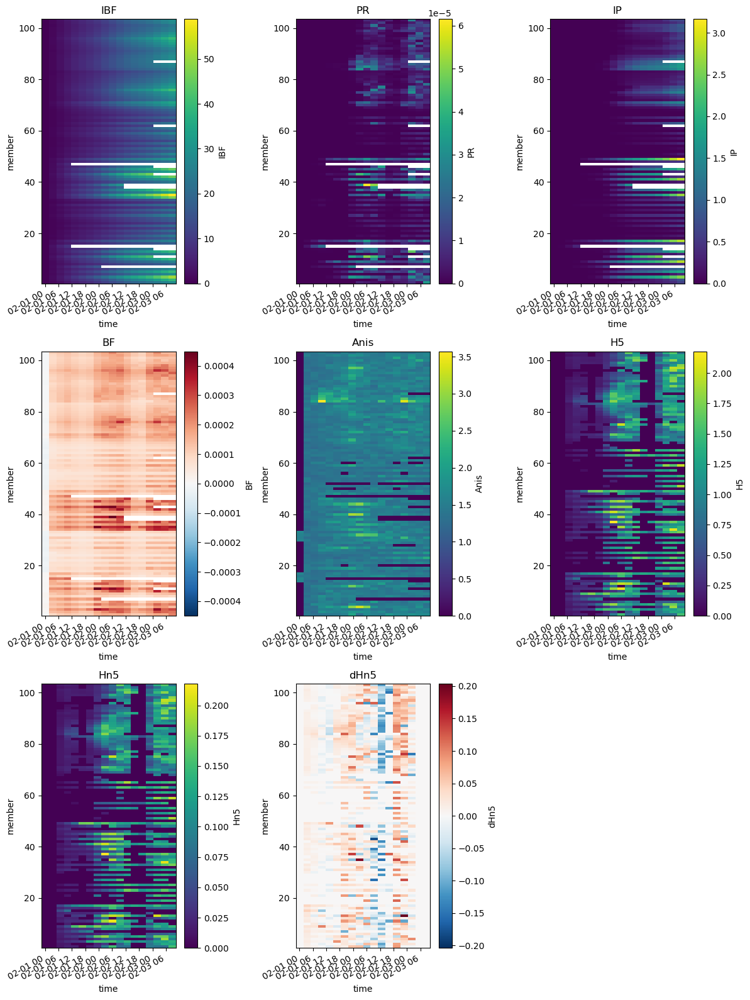

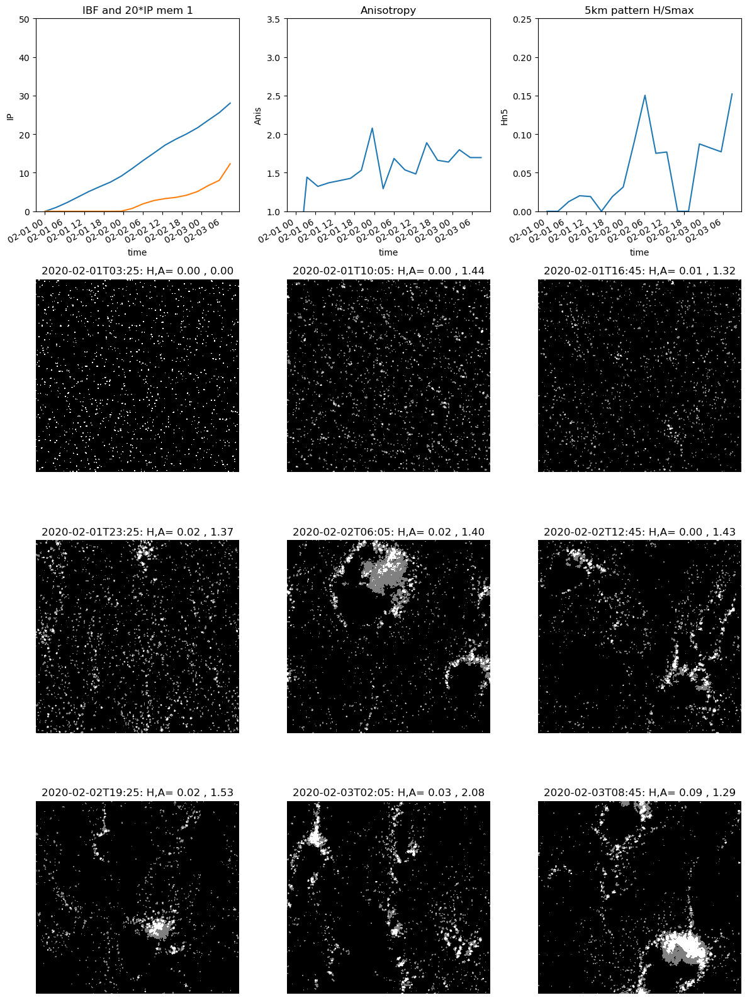

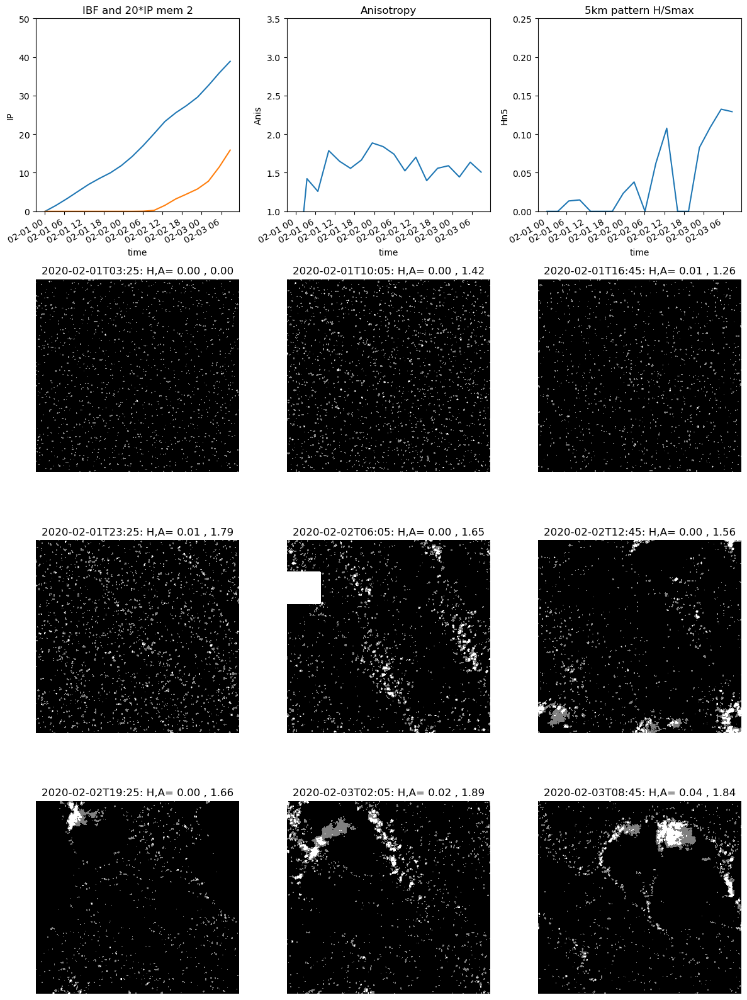

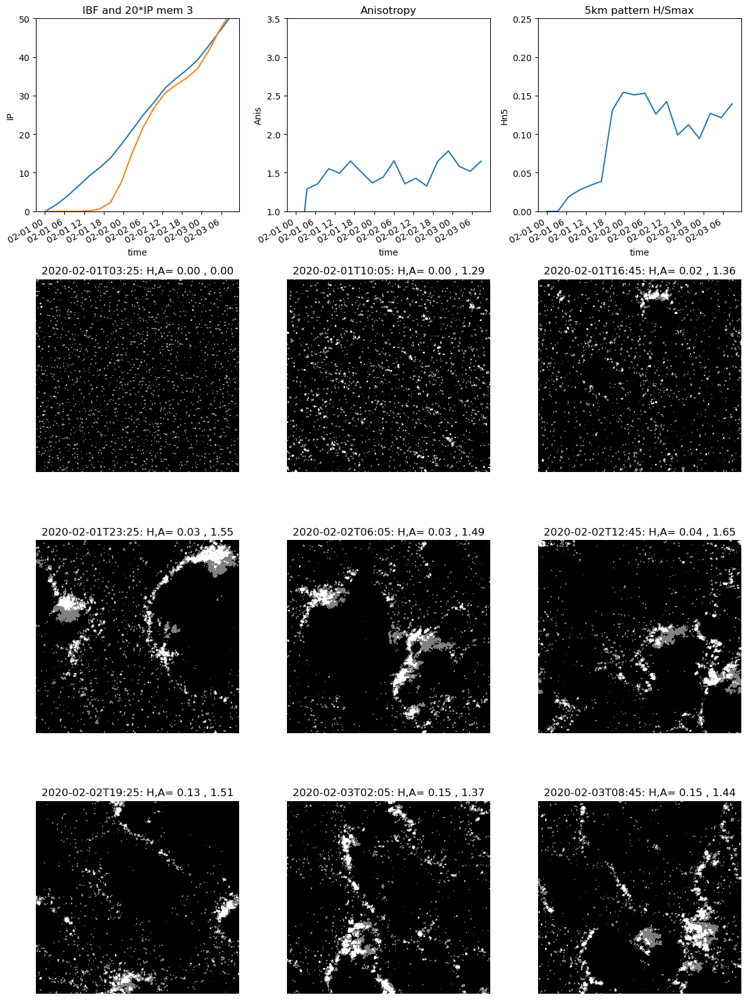

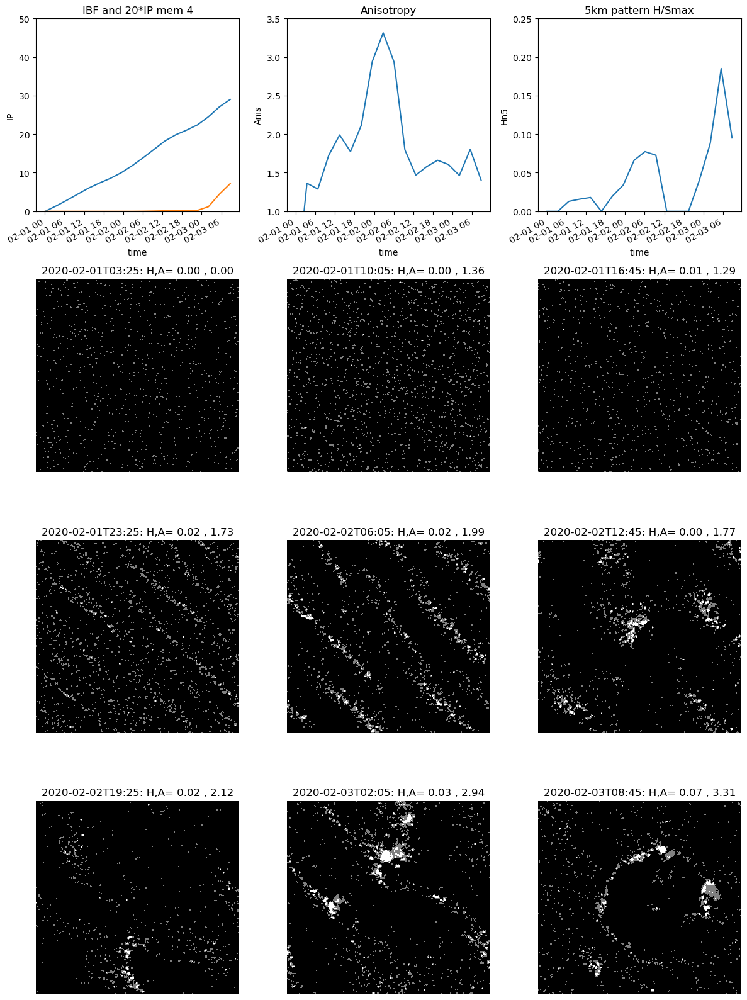

...

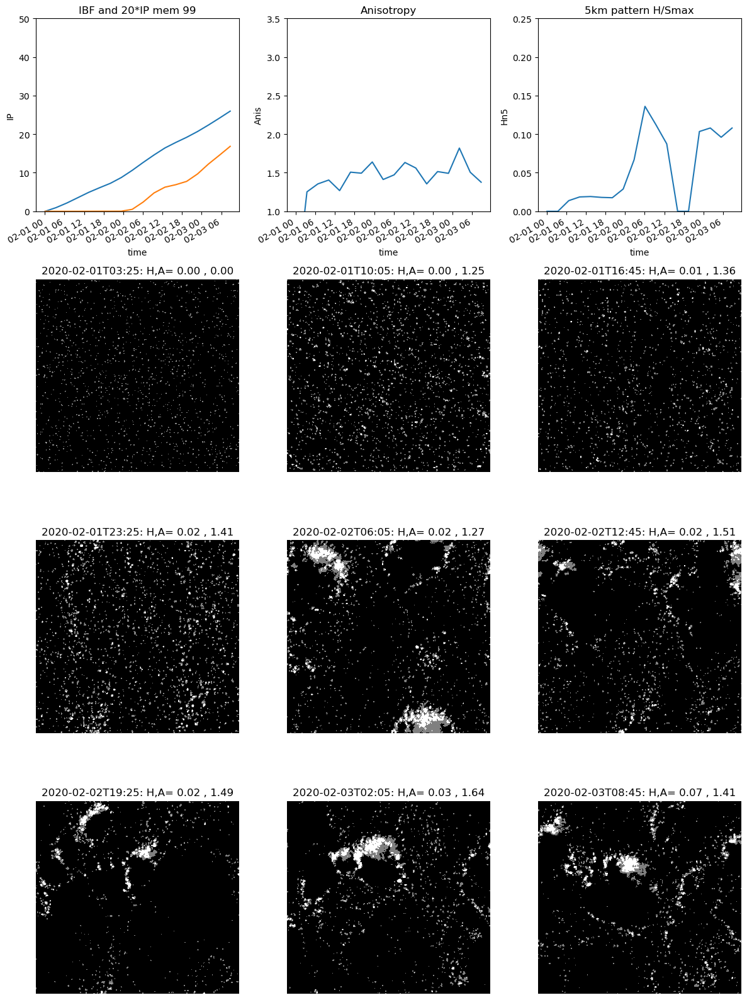

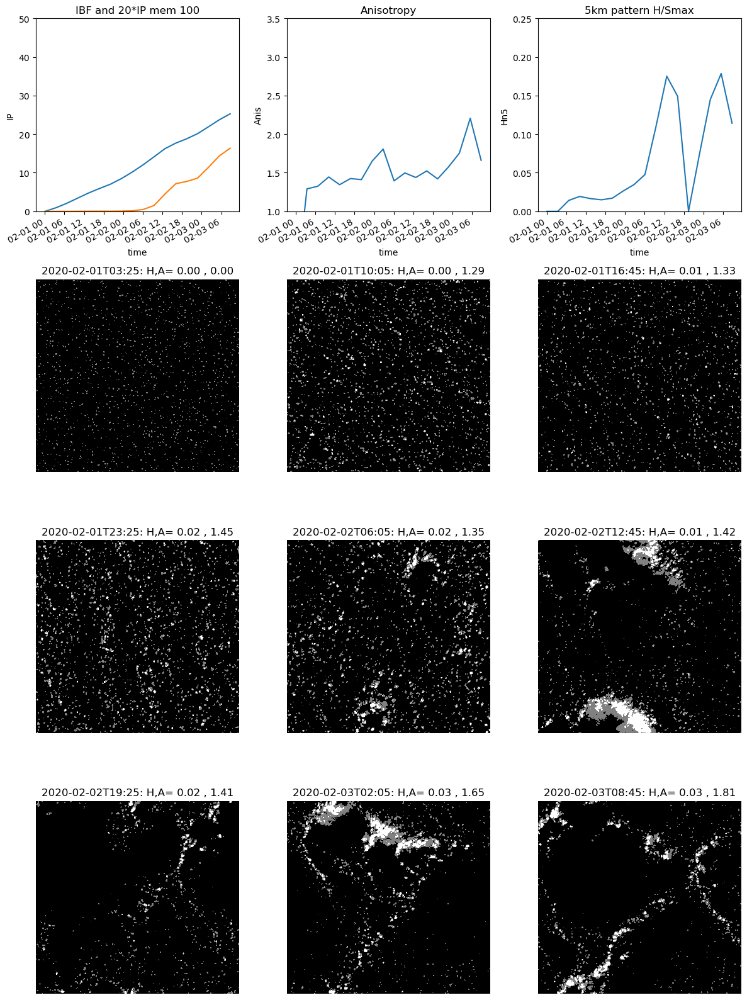

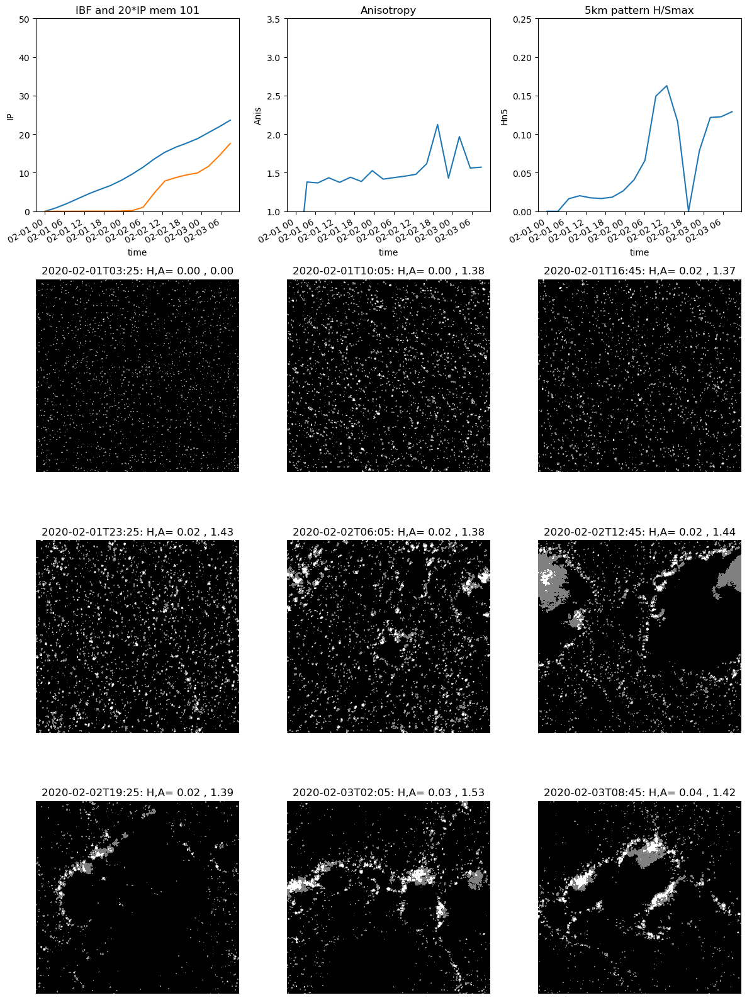

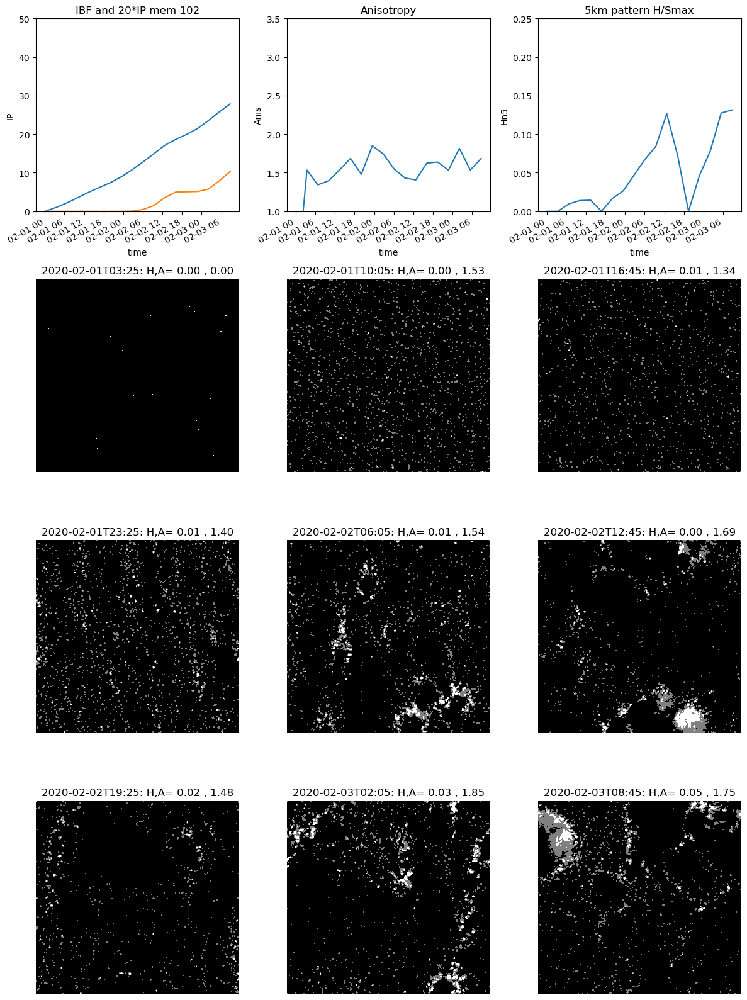

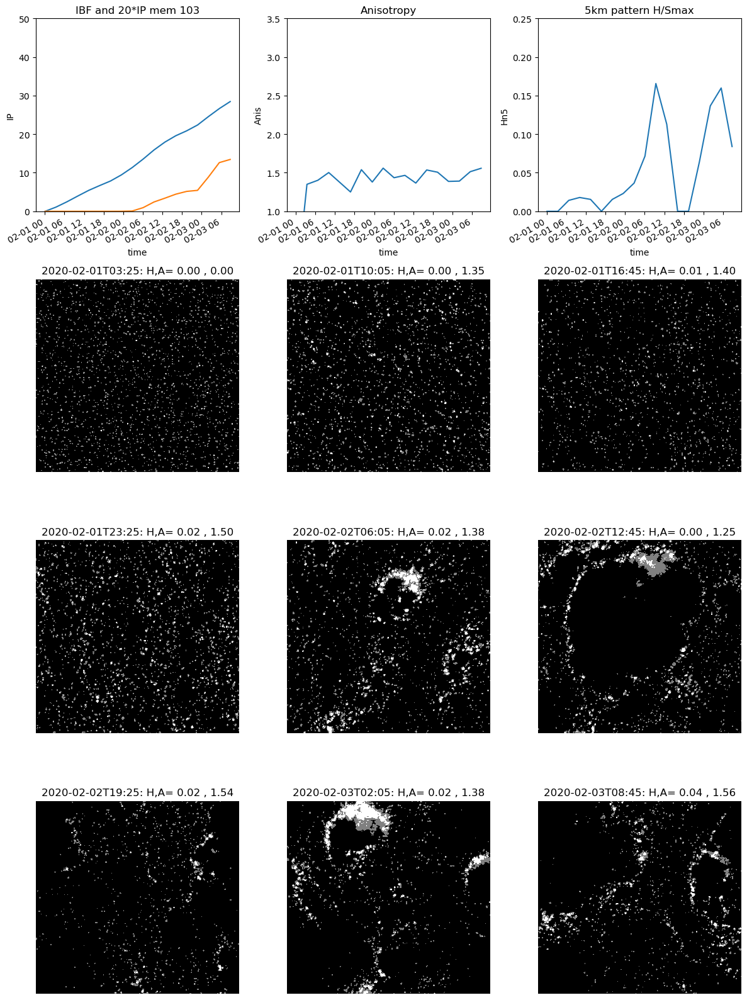

In [261]:
# Let's make a 103 page PDF with all the members displayed, after an index page 
# Multipage PDF file https://gist.github.com/thanasi/7e08bc41e6a085cd2140
from matplotlib.backends.backend_pdf import PdfPages


with PdfPages('AllSimulations.9times.contourf.pdf') as pdf:
    vars = list(ds_pattern.keys()) 
    
    # Index page of all the variables 
    plt.figure( figsize=(12,16) )
    for i,var in enumerate(vars): 
        plt.subplot(3,3,i+1)
        ds_pattern[var].plot(); plt.title(var)
    plt.tight_layout()
    pdf.savefig()  # saves the current figure into a pdf page
    
    # Loop over members, one page per member. Plot 3 variables, then 9 images (15 panels)
    for imem, member in enumerate(ds_pattern.member):

            plt.figure( figsize=(12,16) )

# top 3 line plots
            plt.subplot(4,3,1)
            ds_pattern['IBF'][imem].plot(); plt.ylim([0,50]) 
            (20*ds_pattern['IP'][imem]).plot(); 
            plt.title('IBF and 20*IP mem ' + str(imem+1))
        
            plt.subplot(4,3,2)
            ds_pattern['Anis'][imem].plot(); plt.ylim([1,3.5]) 
            plt.title('Anisotropy')
        
            plt.subplot(4,3,3)
            ds_pattern['Hn5'][imem].plot(); plt.ylim([0,0.25]) 
            plt.title('5km pattern H/Smax')
        
# Time series of images every 400 minutes
            for it in range( ds_pattern.time.size //2 ): 
                plt.subplot(4,3,4 + it)
                np.sqrt(ds_2D.lwp[imem][it*2+1]).plot.contourf( \
                    cmap='gray', vmin=0, vmax=0.5, levels=[0.2,0.6], add_colorbar=False)
                plt.axis('off')
                plt.title(str(ds_2D.time[it*2+1].values)[0:16]+\
                          ': H,A= '+'{:.2f}'.format( ds_pattern.Hn5[imem][it].values ) + ' , '+\
                                    '{:.2f}'.format( ds_pattern.Anis[imem][it].values) )
                
            plt.tight_layout()
            pdf.savefig()  # saves the current figure into a pdf page


In [ ]:
# practice it for a given it, imem 

In [ ]:
            plt.figure( figsize=(12,16) )

# top 3 line plots
            plt.subplot(4,3,1)
            ds_pattern['IBF'][imem].plot(); plt.ylim([0,50]) 
            (20*ds_pattern['IP'][imem]).plot(); 
            plt.title('IBF and 20*IP mem ' + str(imem+1))
        
            plt.subplot(4,3,2)
            ds_pattern['Anis'][imem].plot(); plt.ylim([0,2.5]) 
            plt.title('Anisotropy')
        
            plt.subplot(4,3,3)
            ds_pattern['Hn5'][imem].plot(); plt.ylim([0,0.25]) 
            plt.title('5km pattern H/Smax')
     
# Time series of images every 400 minutes
            for it in range( ds_pattern.time.size //2 ): 
                plt.subplot(4,3,4 + it)
                np.sqrt(ds_2D.lwp[imem][it*2+1]).plot.contourf( \
                    cmap='gray', vmin=0, vmax=0.5, levels=[0.2,0.6], add_colorbar=False)
                plt.axis('off')
                plt.title(str(ds_2D.time[it*2+1].values)[0:16]+\
                          ': H,A= '+'{:.2f}'.format( ds_pattern.Hn5[imem][it].values ) + ' , '+\
                                    '{:.2f}'.format( ds_pattern.Anis[imem][it].values) )
             
            plt.tight_layout()


In [250]:
import datetime
ttt = ds_2D.time[it*2+1].values
#ttt.astype(datetime.datetime).strftime('%Y.%m.%d')

str(ttt)[0:16] #.astype('U').view('U10').item()

'2020-02-01T03:25'

In [237]:
'2020-02-01T03:25'

Object `rstrip` not found.


---------------
# Pathways Plots for growth of normalized H 

------------- 
# First draft plots, highly labeled 

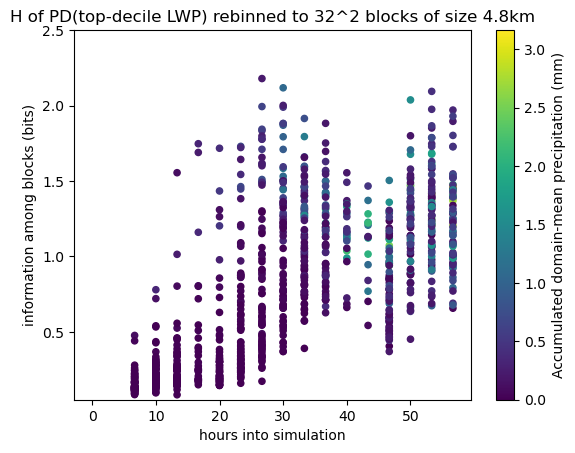

In [341]:
# Octave 3 is nice enough for seeing mesoscale (>4.8km) information growth
oc = 3
boxsize = 0.6 *octaves[oc]   # km, boxsize as we have taken every 6th 100m gridcell

# Scatterplot requires a meshgrid trick, a time coordinate for each simulation
plt.scatter( np.meshgrid(tt,ds_profiles.member)[0], Hs[:,:,oc], \
            c=ds_profiles.IP.sel(time = ds_2D.time), s=20)

plt.ylim([0.05,2.5])
plt.title('H of PD(top-decile LWP) rebinned to '+str(int(256/octaves[oc]))+ \
          '^2 blocks of size '+str((boxsize))+'km');
plt.ylabel('information among blocks (bits)') ;
plt.xlabel('hours into simulation');
cbar = plt.colorbar()
cbar.set_label('Accumulated domain-mean precipitation (mm)')

# annotate with simulation numbers for points? no 
#for i, txt in enumerate(results.index):
#    plt.annotate(txt+1, (results.wT1[i],results.altitude[i]))


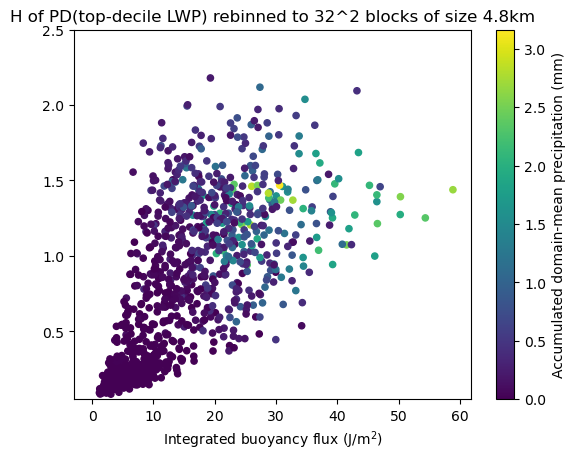

In [340]:
plt.scatter( ds_profiles.IBF.sel(time = ds_2D.time), Hs[:,:,3], \
            c=ds_profiles.IP.sel(time = ds_2D.time), \
            s=20)
plt.ylim([0.05,2.5])
plt.title('H of PD(top-decile LWP) rebinned to '+str(int(256/octaves[oc]))+ \
          '^2 blocks of size '+str((boxsize))+'km');

#plt.ylabel('pattern information among 32x32 blocks (bits)')
plt.xlabel('Integrated buoyancy flux (J/m$^2$)');
cbar = plt.colorbar()
cbar.set_label('Accumulated domain-mean precipitation (mm)')

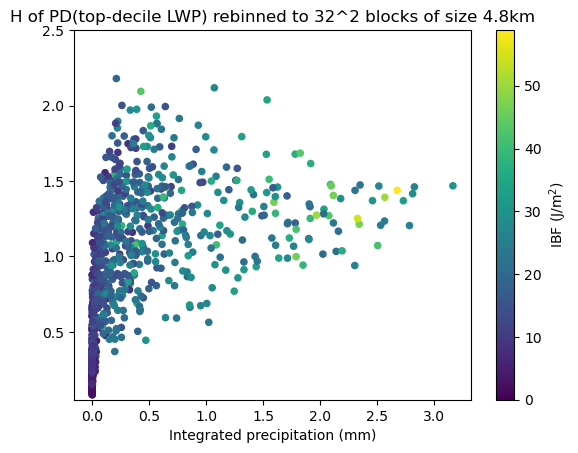

In [342]:
plt.scatter( ds_profiles.IP.sel(time = ds_2D.time), Hs[:,:,3], \
            c=ds_profiles.IBF.sel(time = ds_2D.time), \
            s=20)
plt.ylim([0.05,2.5])
plt.title('H of PD(top-decile LWP) rebinned to '+str(int(256/octaves[oc]))+ \
          '^2 blocks of size '+str((boxsize))+'km');

#plt.ylabel('pattern information among 32x32 blocks (bits)')
plt.xlabel('Integrated precipitation (mm)');
cbar = plt.colorbar()
cbar.set_label('IBF (J/m$^2$)')

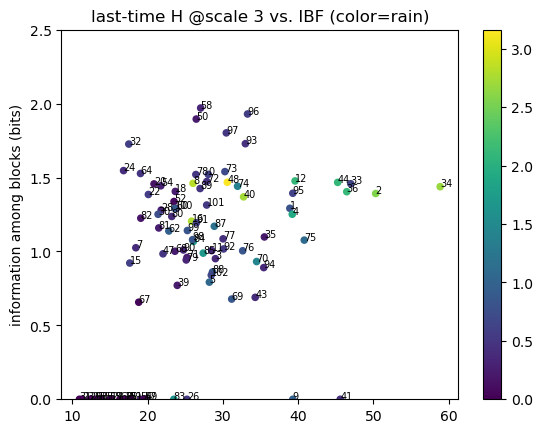

In [441]:
# Plot H at final time level
# annotate with experiment number, for choosing case studies 

# Apparently precip is correlated with large IBF cases, makes sense perhaps 

plt.scatter( ds_profiles.IBF.sel(time = ds_2D.time)[:,-1], Hs[:,-1,3], \
            c=ds_profiles.IP.sel(time = ds_2D.time)[:,-1], s=20) 

xxx = ds_profiles.IBF.sel(time = ds_2D.time)[:,-1]
yyy = Hs[:,-1,3]
m=np.array( range(103) ).astype(str)

for iii in range(103):
    plt.annotate(m[iii], [xxx[iii],yyy[iii]], size=7)

plt.ylim([0,2.5])
plt.colorbar()
plt.title('last-time H @scale 3 vs. IBF (color=rain)');
plt.ylabel('information among blocks (bits)') ;
plt.ylabel('information among blocks (bits)') ;

# interrogate parameters of selected cases from above
# df_parameters.iloc[ [2,9,32,33,34,35,36] ]  # dataset from other CloudBotany notebook on server